<font size=6>**Lecture 6: Classification Summary & Regularized Regression**</font>
<div style="border: 1px solid lightgray; padding: 10px; background-color: #f9f9f9;">
<font size=1>

    Paolo Bonfini, 2024. All rights reserved.

This work is the intellectual property of `Paolo Bonfini`. All content produced in this notebook is original creation of the author unless specified otherwise. Unauthorized use, reproduction, or distribution of this material, in whole or in part, without explicit permission from the author, is strictly prohibited.
</font>
</div>

_NOTE: The Regularization theory and definition reported here is just a summary, for the whole picture refer to Gerone (2017) book, chapter 4._


# Classification Summary

We have seen the SVM classifier, the Decision Tree and Random Forests, the $k$ Nearest Neighbors, and Logistic Regression.

We also saw their algorithms, and realized they are completely different beasts.

## Quick summary: $k$NN


The predicted class is the local average of the labels of the $k$ nearest neighbors:

> $y = \frac{1}{k} \sum_{x_i \in N_k(x)} y_{i}$

where $N_k(x)$ is the neighborhood around $x_i$, composed by $k$ points.<br>
_NOTE: In classification problems, we actually use the mode._


<div>
   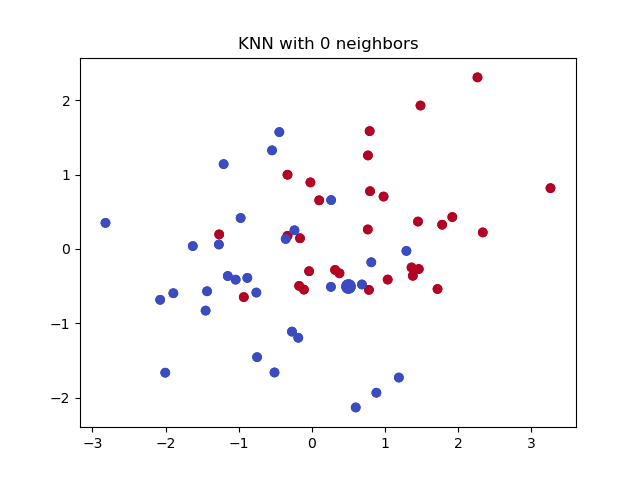
</div>

<table><tr>
    <td width=500>
        <center>
            <br>
            Figure 1. Classification using majority votes of $k$ neighbors, for different values of $k$.<br>
            (From <a href=https://importq.wordpress.com/2017/11/24/mnist-analysis-using-knn/>here</a>)
        </center>
    </td>
</tr></table>

## Quick summary: Logistic Regression

Logistc Regression fits a logistic function ...

<div>
   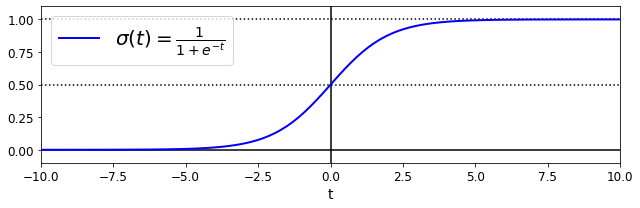
</div>

<table><tr>
    <td width=700>
        <center>
            <br>
            Figure 1. Logistic function.<br>
        </center>
    </td>
</tr></table>

... to the data (just set your labels to '1' or '0'):

<div>
   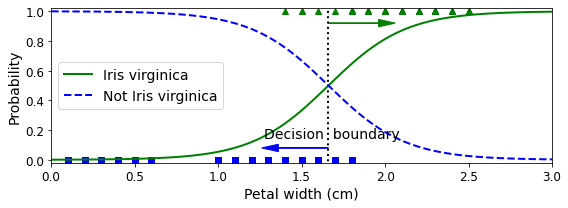
</div>

<table><tr>
    <td width=700>
        <center>
            <br>
            Figure 2. Logistic Regression applied to Iris data.<br>
        </center>
    </td>
</tr></table>

The decision function is setteled by the middle point of the fitted curve.

## Classifiers Comparison

These are just a few example of a ever-growing family of classifiers.  Let's display a few more, and how they act on different dataset types.

_The following block is adapted from this <code>sklearn</code> [page](https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html)._

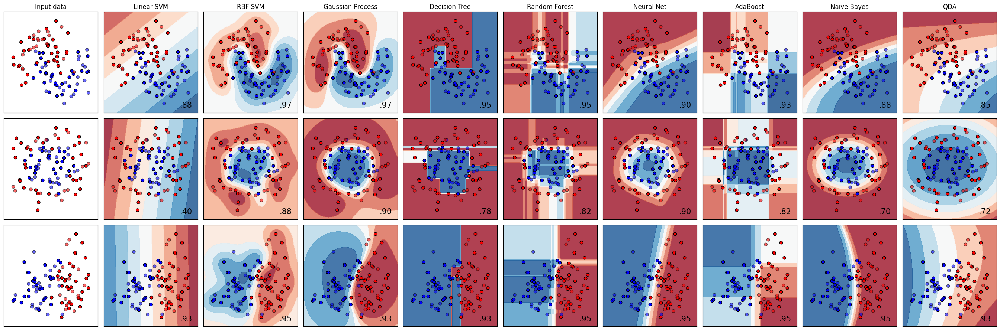

In [1]:
# Code source: Gaël Varoquaux
#              Andreas Müller
# Modified for documentation by Jaques Grobler
# License: BSD 3 clause

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.inspection import DecisionBoundaryDisplay

names = [
    "Linear SVM",
    "RBF SVM",
    "Gaussian Process",
    "Decision Tree",
    "Random Forest",
    "Neural Net",
    "AdaBoost",
    "Naive Bayes",
    "QDA",
]

classifiers = [
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(),
]

X, y = make_classification(
    n_features=2, n_redundant=0, n_informative=2, random_state=1, n_clusters_per_class=1
)
rng = np.random.RandomState(2)
X += 2 * rng.uniform(size=X.shape)
linearly_separable = (X, y)

datasets = [
    make_moons(noise=0.3, random_state=0),
    make_circles(noise=0.2, factor=0.5, random_state=1),
    linearly_separable,
]

figure = plt.figure(figsize=(27, 9))
i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    X, y = ds
    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.4, random_state=42
    )

    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

    # just plot the dataset first
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(["#FF0000", "#0000FF"])
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, edgecolors="k")
    # Plot the testing points
    ax.scatter(
        X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6, edgecolors="k"
    )
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)
        DecisionBoundaryDisplay.from_estimator(
            clf, X, cmap=cm, alpha=0.8, ax=ax, eps=0.5
        )

        # Plot the training points
        ax.scatter(
            X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, edgecolors="k"
        )
        # Plot the testing points
        ax.scatter(
            X_test[:, 0],
            X_test[:, 1],
            c=y_test,
            cmap=cm_bright,
            edgecolors="k",
            alpha=0.6,
        )

        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
        ax.text(
            x_max - 0.3,
            y_min + 0.3,
            ("%.2f" % score).lstrip("0"),
            size=15,
            horizontalalignment="right",
        )
        i += 1

plt.tight_layout()
plt.show()

<div class="alert alert-block alert-warning" style="margin-top: 20px">
**In-class discussion**

Observe this image, and try to grasp the main concepts:

- What do you observe, regarding the **decision functions**?

- Are all classifiers **equivalently good** with different dataset types?
</div>

**Q:** How shall we **assess the performance**?<br>

<div class="alert alert-danger alertdanger" style="margin-top: 20px">
<details>
    
<b><summary>[Spoiler] (click here to expand)</summary></b>
    
  $\rightarrow$ Always look at the test set (<i>see how the score is calculated?</i>)!<br>
    <i>Remove the train point to look at the test set alone.</i>
   
</details>
</div>


**Q:** What about **hyperparameters**? Is it possible that by changing its hyperparameters, one classifier performs better?<br>

<div class="alert alert-danger alertdanger" style="margin-top: 20px">
<details>
<summary><b>[Spoiler]</b></summary>
  Yes.  The best classifier is the one whose best hyperparameter set yields the best score.
  
  $\rightarrow$ we must try all configurations with CV!
</details>
</div>

# Model selection

> _We shall use a CV where we try **all** models, and **all** their hyperparameters combinations!_

<div>
   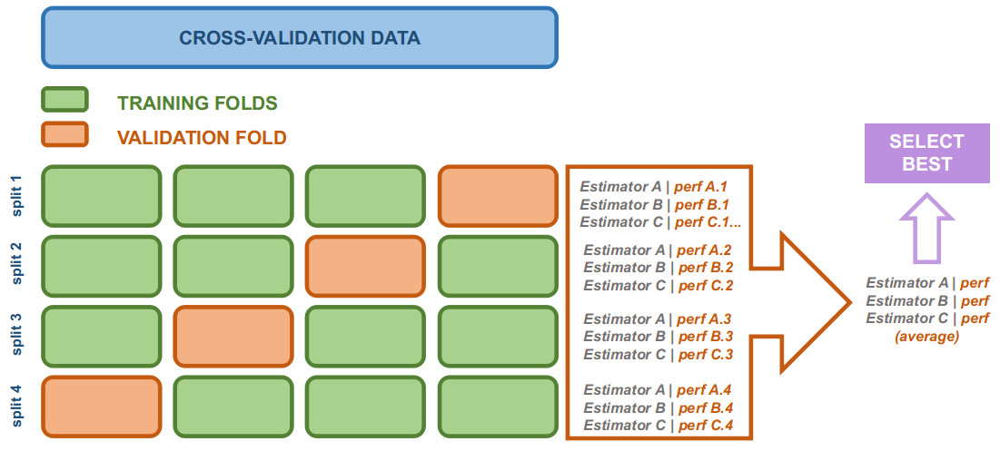
</div>

<table><tr>
    <td width=700>
        <center>
            <br>
            Figure 3. Using CV to select among multiple estimators.<br>
        </center>
    </td>
</tr></table>

**Example :** With a CV of 3 folds, and 4 estimators, each having 2 possible hyperparameter sets, we must perform:
$3 \times 4 \times 2 = 24$ fits 

Notice that $-$ _equivalently_ $-$ we can also:
- run 5 cross-validations (_one per estimator_)
- pick the best hyperparameter configuration for each estimator (_5 models_)
- pick the best estimator overall

A simple query with your `favorite-AI-of-unknown-brand`, returns a script to do compare:
- `RandomForestClassifier`
- `SVC`
- `LogisticRegression`
- `KNeighborsClassifier`

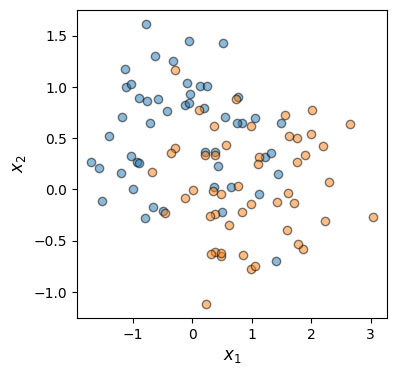

In [1]:
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split

X, y = make_moons(n_samples=100, noise=0.4, random_state=53)

colors = {0: 'C0', 1: 'C1'}
# colors dictionary indexed by class label

from matplotlib import pyplot as plt
plt.figure(figsize=(4, 4))
plt.scatter(X[:, 0][y==0], X[:, 1][y==0], c=colors[0], marker='o', edgecolors='k', alpha=0.5)
plt.scatter(X[:, 0][y==1], X[:, 1][y==1], c=colors[1], marker='o', edgecolors='k', alpha=0.5)
plt.xlabel(r"$x_1$", fontsize=12)
plt.ylabel(r"$x_2$", fontsize=12)
plt.show()

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [5]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Scale features (important for SVM and kNN):
scaler = StandardScaler()
X_train_n = scaler.fit_transform(X_train)
X_test_n = scaler.transform(X_test)

# Define hyperparameter space for each classifier:
param_dist = {
    'RandomForest': {'n_estimators': [10, 50, 100, 200],
                     'max_depth': [None, 10, 20, 30],
                     'max_features': [1, 2]},
    'SVM': {'C': [0.1, 1, 5],
            'kernel': ['linear', 'rbf']},
    'LogisticRegression': {'C': [0.1, 1, 10],
                           'penalty': ['l2', 'l1']},
    'kNN': {'n_neighbors': list(range(1, 31)),
            'metric': ['euclidean', 'manhattan']}
}

# Create a dictionary of classifiers:
classifiers = {
    'RandomForest': RandomForestClassifier(random_state=42),
    'SVM': SVC(),
    'LogisticRegression': LogisticRegression(solver='liblinear'),
    'kNN': KNeighborsClassifier()
}

# Conduct randomized search with cross-validation for each classifier:
best_classifiers = {}
for name in classifiers:
    print('[===== Performing search on %s =====]' % name)
    
    search = RandomizedSearchCV(classifiers[name],
                        param_distributions=param_dist[name],
                        n_iter=5, cv=3, scoring='accuracy',
                        verbose=3, random_state=42)
    search.fit(X_train_n, y_train)
    
    best_classifiers[name] = search.best_estimator_
    '''NOTE: `best_estimator_` returns the classifier refit on all CV data
              using the best hyperparameter configuration.'''
    
    print("Best parameters for %s: %s" % (name,search.best_params_))
    print()

# Evaluate each model on the test set, to pick the best model:
winner_classifier = None
winner_score = 0
for name, classifier in best_classifiers.items():
    yhat_test = classifier.predict(X_test_n)
    score = accuracy_score(y_test, yhat_test)
    print(f"Accuracy for best-%s: %s" % (name, score))
    
    if score > winner_score:
        winner_score = score
        winner_classifier = best_classifiers[name]
        
print('\n>>> And the winner is:\n\t')
display(winner_classifier)

[===== Performing search on RandomForest =====]
Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV 1/3] END max_depth=30, max_features=2, n_estimators=50;, score=0.889 total time=   0.1s
[CV 2/3] END max_depth=30, max_features=2, n_estimators=50;, score=0.741 total time=   0.1s
[CV 3/3] END max_depth=30, max_features=2, n_estimators=50;, score=0.615 total time=   0.1s
[CV 1/3] END max_depth=10, max_features=2, n_estimators=200;, score=0.852 total time=   0.4s
[CV 2/3] END max_depth=10, max_features=2, n_estimators=200;, score=0.741 total time=   0.4s
[CV 3/3] END max_depth=10, max_features=2, n_estimators=200;, score=0.615 total time=   0.4s
[CV 1/3] END max_depth=30, max_features=1, n_estimators=10;, score=0.741 total time=   0.0s
[CV 2/3] END max_depth=30, max_features=1, n_estimators=10;, score=0.778 total time=   0.0s
[CV 3/3] END max_depth=30, max_features=1, n_estimators=10;, score=0.615 total time=   0.0s
[CV 1/3] END max_depth=20, max_features=1, n_estimators=50;, 

LogisticRegression(C=0.1, solver='liblinear')

Except that your `favorite-AI-of-unknown-brand` made 2 **huge mistakes**.

**Q:** Can you spot them?

<div class="alert alert-danger alertdanger" style="margin-top: 20px">
<details>
<summary><b>[Spoiler]</b></summary>
  1. <i>Look at where the normalization is performed</i><br>
  2. <i>Look at how the best model is picked, and compare to Figure 3</i>
</details>
<div>

## Model selection, the right way

The score used to selec the best model must be evaluated as the **average on the validation folds**!<br>
(_see Figure 3_)

<u>NOTE:</u> We will ignore the normalization step, for simplicity.

In [6]:
# Same as above --------------------------------------------------------------
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

param_dist = {
    'RandomForest': {'n_estimators': [10, 50, 100, 200],
                     'max_depth': [None, 10, 20, 30],
                     'max_features': [1, 2]},
    'SVM': {'C': [0.1, 1, 5],
            'kernel': ['linear', 'rbf']},
    'LogisticRegression': {'C': [0.1, 1, 10],
                           'penalty': ['l2', 'l1']},
    'kNN': {'n_neighbors': list(range(1, 31)),
            'metric': ['euclidean', 'manhattan']}
}

classifiers = {
    'RandomForest': RandomForestClassifier(random_state=42),
    'SVM': SVC(),
    'LogisticRegression': LogisticRegression(solver='liblinear'),
    'kNN': KNeighborsClassifier()
}
#-----------------------------------------------------------------------------

best_classifiers = {}
best_scores = {}
# ^These collect the best hyperparamers and the best score for each classifier

# Conduct randomized search with cross-validation for each classifier:
for name, classifier in classifiers.items():
    print('[===== Performing search on %s =====]' % name)
    
    search = RandomizedSearchCV(classifiers[name],
                        param_distributions=param_dist[name],
                        n_iter=5, cv=3, scoring='accuracy',
                        verbose=3, random_state=42)
    
    search.fit(X_train, y_train)
    best_classifiers[name] = search.best_estimator_
    best_scores[name] = search.best_score_
    '''NOTE: This is, as per `RandomizedSearchCV` documentation, the:
    
                 "Mean cross-validated score of the best_estimator"
             
             which is exactly what we need to select the winner classifier.
             '''
    
    print("Best parameters for %s: %s" % (name,search.best_params_))
    print("score: %.2f" % search.best_score_)
    print()
    
# Determine the overall best model:
winner_name = max(best_scores, key=best_scores.get)
# name of winner (a string)
winner_classifier = best_classifiers[winner_name]
# the actuall fitted model (a `sklearn` object)
'''Here we select the winner, based on the average score achieved on the
validation sets.'''

print('\n>>> And the winner is:\n\t')
display(winner_classifier)

[===== Performing search on RandomForest =====]
Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV 1/3] END max_depth=30, max_features=2, n_estimators=50;, score=0.889 total time=   0.1s
[CV 2/3] END max_depth=30, max_features=2, n_estimators=50;, score=0.741 total time=   0.1s
[CV 3/3] END max_depth=30, max_features=2, n_estimators=50;, score=0.615 total time=   0.1s
[CV 1/3] END max_depth=10, max_features=2, n_estimators=200;, score=0.852 total time=   0.4s
[CV 2/3] END max_depth=10, max_features=2, n_estimators=200;, score=0.741 total time=   0.4s
[CV 3/3] END max_depth=10, max_features=2, n_estimators=200;, score=0.615 total time=   0.4s
[CV 1/3] END max_depth=30, max_features=1, n_estimators=10;, score=0.741 total time=   0.0s
[CV 2/3] END max_depth=30, max_features=1, n_estimators=10;, score=0.778 total time=   0.0s
[CV 3/3] END max_depth=30, max_features=1, n_estimators=10;, score=0.615 total time=   0.0s
[CV 1/3] END max_depth=20, max_features=1, n_estimators=50;, 

SVC(C=5, kernel='linear')

## Assessing performance

Now, if we want, we can assess the **performance** of the winner model on the _hold_-out **test set**

> _This test set was <u>never</u> used in the CVs $\rightarrow$ Un-biased performance assessment!_

<div>
   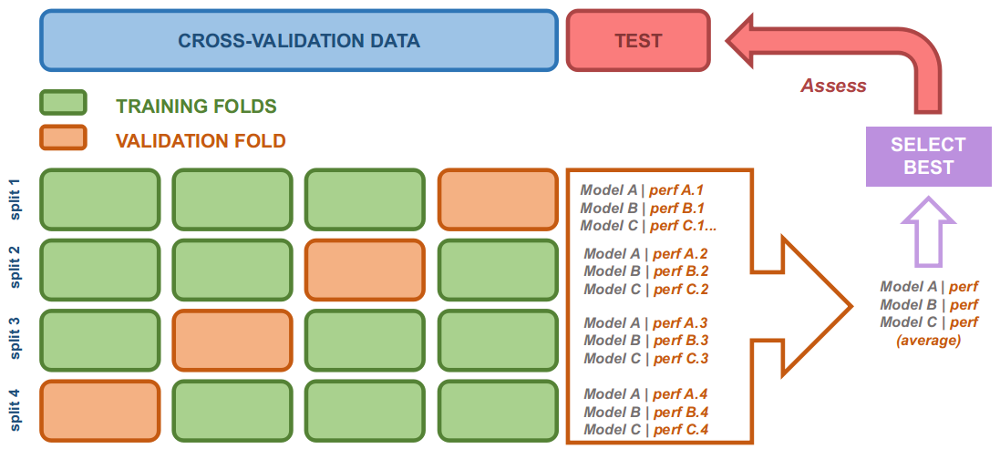
</div>

<table><tr>
    <td width=700>
        <center>
            <br>
            Figure 4. Complete protocol for model selection + assessment.<br>
        </center>
    </td>
</tr></table>

In [7]:
# Evaluate the best overall model on the test set:
yhat_test = winner_classifier.predict(X_test)

winner_score = accuracy_score(y_test, yhat_test)

print(f"Accuracy for winner classifier: %s" % score)

Accuracy for winner classifier: 0.8


## What if I want to add a scaler, or any other pre-/post-processing?

Then, your "model" becomes a **pipeline**:

<div>
   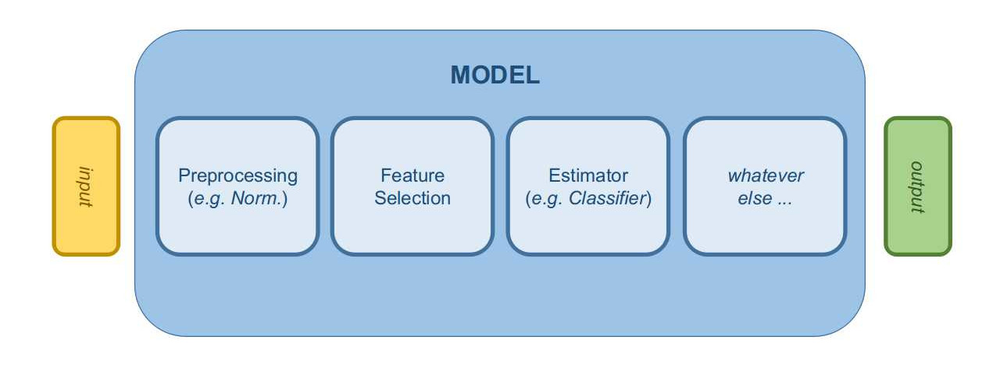
</div>

<table><tr>
    <td width=700>
        <center>
            <br>
            Figure 5. The most generic model prototype, including other steps other than the estimator.<br>
        </center>
    </td>
</tr></table>

In [8]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC

pipeline = Pipeline([
    ('scaler', MinMaxScaler()),
    ('svc', SVC())
])

Which you can fit/tune with the usual `sklearn` syntax:

In [9]:
param_dist = {
    'scaler__feature_range': [(0, 10), (0.5, 1)],  # Feature range for MinMaxScaler
    'svc__C': [0.1, 1, 10],                        # Regularization parameter for SVC
    'svc__kernel': ['linear', 'rbf'],              # Type of kernel for SVC
    'svc__gamma': ['scale', 'auto']                # Kernel coefficient for SVC
}
'''Notice how the `scaler` has its own hyperparameters, now.

The scaler and classifier names must be the same as you defined in `pipeline`:
    <scaler>__ ...
    <svc>__ ...

IMPORTANT: Mind the double underscore "__".
'''

search = RandomizedSearchCV(pipeline, param_dist, n_iter=10, cv=5,
                            scoring='accuracy', random_state=42)
'''You just have to pass `pipeline` to `RandomizedSearchCV`.'''

# All the rest will be the same as well:
search.fit(X_train, y_train)
best_model = search.best_estimator_
yhat_test = best_model.predict(X_test)

display(best_model)

Pipeline(steps=[('scaler', MinMaxScaler(feature_range=(0, 10))),
                ('svc', SVC(C=10, kernel='linear'))])

# Quick summary: Regression

The transition from **Classification** to **Regression** is very smooth $-$ just replace '_class_' with a '_number_':

    Regression = modelling problems where the target is a continuous numeric value
    
In fact, almost all classifier algorithms can be slightly modified to become regressors.    

## Linear regression and least squares

A linear regression model will try to predict the single value of the dependent variable $y$ given the independent variable $x$, with the most generic form being: 

$$y = f (x | θ), $$

where $x$ corresponds to the input variable(s) and $θ$ is an array of parameters.

> Just to avoid confusion, let's clarify that we are talking about **linear** regression when the function $f$ is linear with respect to the parameters $θ$, not with respect to the variable $x$! For example, the function:
>
>$$f (x|θ ) = \sum^k_{p=1} θ_p g_p(x) = θ_1 g_1(x) + θ_2 g_2(x)~+~...~+~θ_k g_k(x) $$
>
>describes a linear problem as long as the sub-functions $g_p(x)$ do not depend on any of the parameters $θ_p$. 


The simplest linear model we can think of is a line:

$$y = θ_0 + θ_1 x $$

where $θ_0$ and $θ_1$ have the usual meaning of intercept and slope of a line. 

Generalizing a bit, for an input vector $x^T = (x_1, x_2, ..., x_N)$,  where $N$ is the total number of samples, the linear **model** to predict the real-valued output $y$ is:

$$ f(x) = θ_0 + \sum_{i=1}^{N} x_i θ_i ~~~~~ (linear~model~for~y)$$

To find these parameters we use the Ordinary Least Squares approach, i.e. we try to minimize the residual sum of the squares between the observations and the predictions by the model (i.e. the cost function):

$$ S(θ) = \sum_{i=1}^{N} (y_i - f(x_i))^2 =  \sum_{i=1}^{N} (y_i - θ_0 - x_i θ_i)^2 .$$



## Issue: models may overfit!

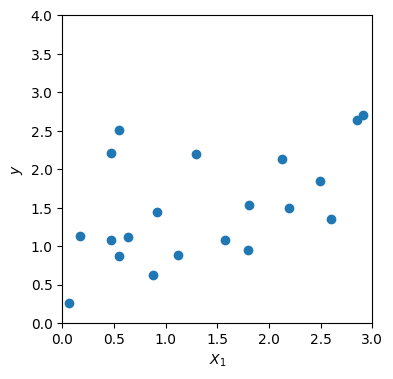

In [11]:
# Generating data:
np.random.seed(42)
m = 20
X = 3 * np.random.rand(m, 1)
y = 1 + 0.5 * X + np.random.randn(m, 1) / 1.5
X_new = np.linspace(0, 3, 100).reshape(100, 1)

plt.figure(figsize=(4, 4))
plt.scatter(X, y)
plt.axis([0, 3, 0, 4])
plt.xlabel('$X_1$')
plt.ylabel('$y$')
plt.show()

We will perform a linear fit using a **polynomial base** model, i.e. simply the generic linear regression form ...

$$f (x|θ ) = \sum^k_{p=1} θ_p g_p(x)$$

... where every $g_p(x)$ is a different polynomial.

E.g., given 2D data points of the type $x_i = (x_1, x_2)$, a 2nd degree polynomial model is:

$$f (x|θ ) = θ_1 g_1(x) + θ_2 g_2(x) + θ_3 g_3(x) + θ_4 g_4(x) + θ_5 g_5(x) $$

$$f (x|θ ) = θ_1 x_1 + θ_2 x_2 + θ_3 x_1^2 + θ_4 x_1 x_2 + θ_5 x_2^2 $$

where we simply set:
- $g_1(x) = x_1$
- $g_2(x) = x_2$
- $g_3(x) = x_1^2$
- $g_4(x) = x_1 x_2$
- $g_5(x) = x_1^2$


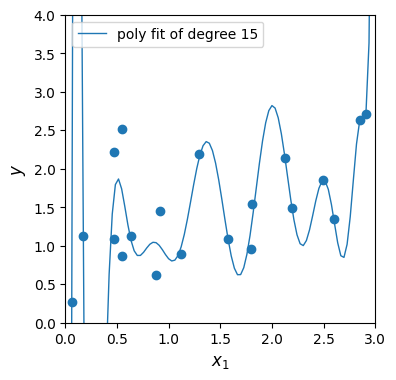

In [12]:
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures

degree = 15

model = LinearRegression()
model = Pipeline([
        ("poly_features", PolynomialFeatures(degree=degree, include_bias=False)),
        # ^ in this very line we calculate the g_p(x) for every x and every p
        ("std_scaler", StandardScaler()),
        ("regul_reg", model),
    ])
model.fit(X, y)
y_new_regul = model.predict(X_new)

plt.figure(figsize=(4, 4))
plt.plot(X_new, y_new_regul, '-', linewidth=1, label=str('poly fit of degree %s' % degree))
plt.scatter(X, y)
plt.legend(loc="upper left", fontsize=10)
plt.xlabel("$x_1$", fontsize=12)
plt.ylabel("$y$",   fontsize=12)
plt.axis([0, 3, 0, 4])
plt.show()

Try to play with the polynomial degree to check how the overfitting changes

# Regularized Linear Models

    Regularization: application of procedures that try to reduce the complexity of a model to avoid overfitting

**Important:** Regularization can be applied to _all_ parametric models, we will just show it for linear models here (_wink, wink, see e.g., SVM_).

In the case of linear regression there is a number of **shrinkage** approaches, where the coefficients $θ$  get '_shrunk_' or '_penalized_'. 

- - - 

**Why doing that ?** Because:
- _Smaller_ coefficients are **less sensitive to changes of the training sample** $\rightarrow$ less prone to overfit
- **Correlation** between variables can lead to poor determination of their coefficients<br>
  _e.g., a large positive and a large negative coefficient on two different variables that cancel out_
 
By taking into account a set of $N$ observations with $p$ features, the residual sum of squares with the penalty function (i.e. cost function) can be rewritten as:

$$ S_{penalized}(θ) = S(θ) + P(θ). $$

**Ridge $-$ a.k.a. L2 regularization** 

In this case the penalty is imposed by the absolute square sum of the coefficients.   

$$ S_{L2}(θ) = S(θ) + λ \sum_{j=1}^{p} θ_j^2 ~~~,~~~λ\geq0 $$

**Lasso $-$ a.k.a. L1 regularization**

Similarly, the Lasso (_L_east _A_bsolute _S_hrinkage and _S_election _O_perator) is a penatly imposed by the absolute sum of the coefficients.

$$ S_{L1}(θ) = S(θ) + λ \sum_{j=1}^{p} |θ_j| ~~~,~~~λ\geq0 $$
 
The greater is $\lambda$ the more the coefficients will shrink.

If $\lambda=0$ $\rightarrow$ no penalty

_NOTE: Although both Ridge and Lasso can shrink the coefficients, Lasso can actually remove them by setting some of them to 0. That way it can remove features and work as a sort of **feature selection**._  

_NOTE: In <code>sklearn</code> $\lambda$ is sometimes referred to as <code>alpha</code>, <code>C</code>, or <code>regularization_param</code>, etc._

## Ridge Regression

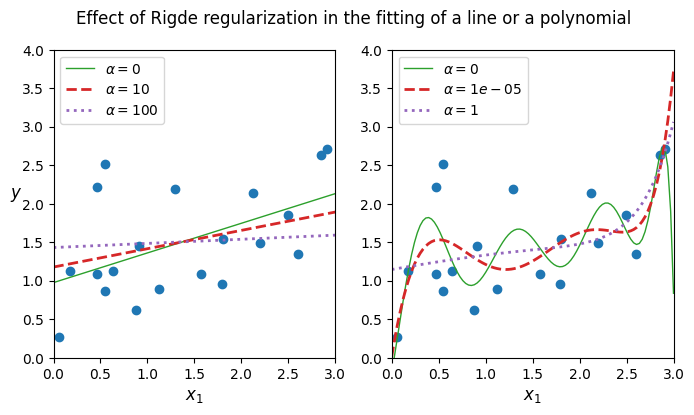

In [15]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures

def plot_model(model_class, polynomial, alphas, **model_kargs):
    for alpha, style in zip(alphas, ("C2", "C3--", "C4:")):
        model = model_class(alpha, **model_kargs) if alpha > 0 else LinearRegression()
        if polynomial:
            model = Pipeline([
                    ("poly_features", PolynomialFeatures(degree=10, include_bias=False)),
                    ("std_scaler", StandardScaler()),
                    ("regul_reg", model),
                ])
        model.fit(X, y)
        y_new_regul = model.predict(X_new)
        lw = 2 if alpha > 0 else 1
        plt.plot(X_new, y_new_regul, style, linewidth=lw, label=r"$\alpha = {}$".format(alpha))
    plt.scatter(X, y)
    plt.legend(loc="upper left", fontsize=10)
    plt.xlabel("$x_1$", fontsize=12)
    plt.axis([0, 3, 0, 4])

plt.figure(figsize=(8,4))
plt.suptitle("Effect of Rigde regularization in the fitting of a line or a polynomial", fontsize=12)
plt.subplot(121)
plot_model(Ridge, polynomial=False, alphas=(0, 10, 100), random_state=42)
plt.ylabel("$y$", rotation=0, fontsize=12)
plt.subplot(122)
plot_model(Ridge, polynomial=True, alphas=(0, 10**-5, 1), random_state=42)

plt.show()

## Lasso Regression

/data/software/miniconda3/envs/ph252/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.803e+00, tolerance: 9.295e-04
  model = cd_fast.enet_coordinate_descent(


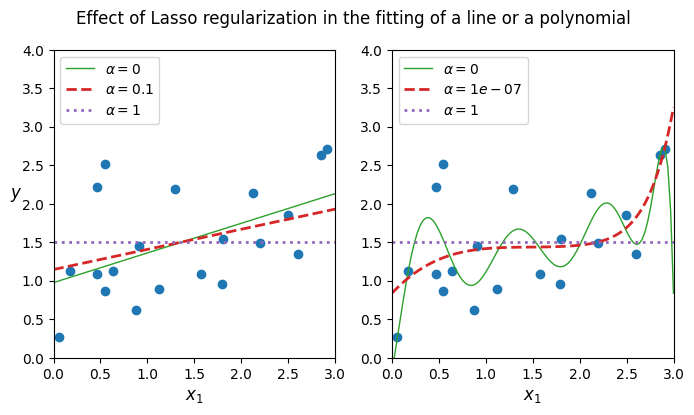

In [16]:
from sklearn.linear_model import Lasso

plt.figure(figsize=(8,4))
plt.suptitle("Effect of Lasso regularization in the fitting of a line or a polynomial", fontsize=12)
plt.subplot(121)
plot_model(Lasso, polynomial=False, alphas=(0, 0.1, 1), random_state=42)
plt.ylabel("$y$", rotation=0, fontsize=12)
plt.subplot(122)
plot_model(Lasso, polynomial=True, alphas=(0, 10**-7, 1), random_state=42)

plt.show()

## Interpretation

Lasso and Ridge try to constrain the parameter search:<br>
(_Recall lecture on Constrained Optimization_)

<div>
   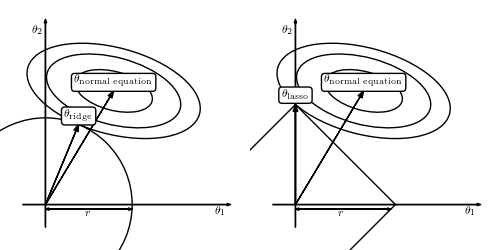
</div>

<table><tr>
    <td width=700>
        <center>
            <br>
            Figure 6. Effect of Lasso and Ridge regularization of the parameter search.<br>
            (From <a href="https://www.astroml.org/book_figures_1ed/chapter8/fig_lasso_ridge.html">here</a>)
        </center>
    </td>
</tr></table>



<div>
   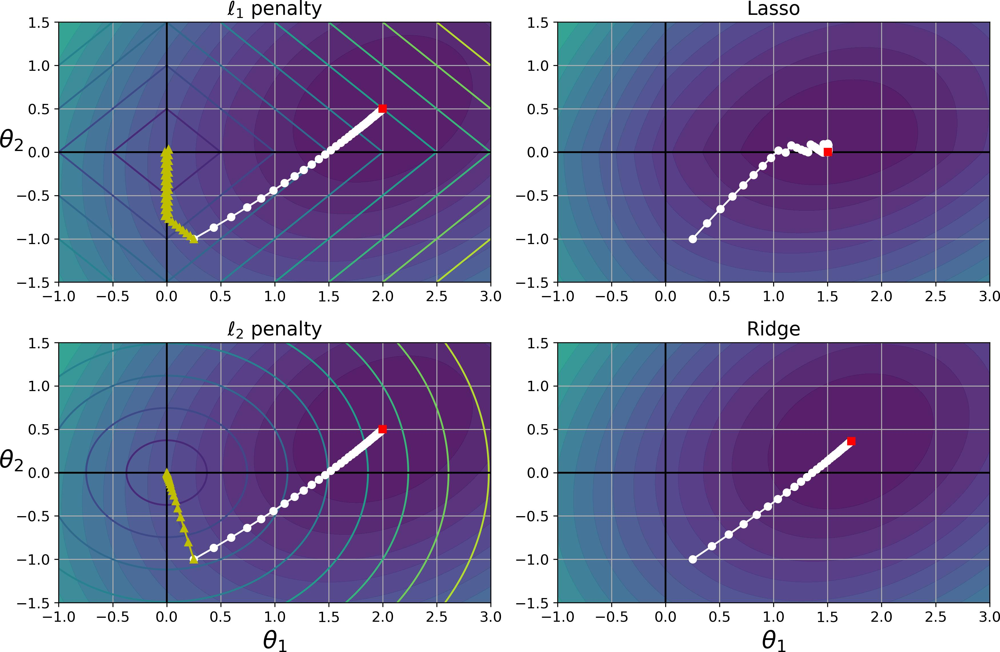
</div>

<table><tr>
    <td width=700>
        <center>
            <br>
            Figure 7. <i>Left</i> - Patterns followed by a gradient descent due to the sole cost function and sole regularization cost.  <i>Right</i> - Actual search patterns.<br>
            (From Figure 4-19 in Gerone's book)
        </center>
    </td>
</tr></table>



## Elastic Net

Is a mix of <code>Lasso</code> and <code>Ridge</code>:

$$ S_{en}(θ) = S(θ) + r λ \sum_{j=1}^{p} θ_j^2 + {1-r \over 2} λ \sum_{j=1}^{p} |θ_j| ~~~,~~~λ\geq0, 0\leq{r}\leq1 $$

$r \rightarrow 0$: becomes <code>Ridge</code><br>
$r \rightarrow 1$: becomes <code>Lasso</code>

<div class="alert alert-block alert-warning" style="margin-top: 20px">

#  In-class Exercise [45 mins]

**Objective:** A sinusoidal signal has been generated for you.  You have only datapoints.  You just know that it is composed of a **few specific frequencies**.

> _But, which ones?_

**Task**: You will assume a **sine base** model, i.e. simply the generic linear regression form ...

$$f (x|θ ) = \sum^k_{p=1} θ_p g_p(x)$$

... where every $g_p(x)$ is a sine function with a different frequency.

> _The <u>real</u> signal has been created using this model with only a **few selected frequencies** !_

To guess which ones $\rightarrow$ You will use a model with **many frequencies** and $-$ by using Regularization $-$ you aim to drop the irrelevant ones!

To do so, you have to play with the **complexity of the model**, and the **regularization** coefficients $\lambda$:

- "**complexity of the model**" $\rightarrow$ add more or less sinusoidal components
- "**regularization**" $\rightarrow$ find the cefficient values that drop the useless components

**Install**: 
    
    %pip install plotly 
    %pip install astroml
    %pip install pymc3
</div>    

<hr style='height:1px'>

_The results of the code below are shown in class, but the code is hidden from user_

In [1]:
import numpy as np                   # for multi-dimensional containers
import pandas as pd                  # for DataFrames
import plotly.graph_objects as go    # for data visualisation
import plotly.io as pio              # to set shahin plot layout
from plotly.subplots import make_subplots
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.ticker import MaxNLocator

pio.templates['shahin'] = pio.to_templated(go.Figure().update_layout(margin=dict(t=80,r=80,b=80,l=80))).layout.template
pio.templates.default = 'shahin'

In [2]:
sample_rate = 1000
start_time = 0
end_time   = 2
theta = 0

time = np.arange(start_time, end_time, 1/sample_rate)

In [3]:
frequency = [3, 5, 2, 1, 10]
amplitude = [1, 1, 1, 1, 1]

In [4]:
fig = make_subplots(rows=5, cols=1, shared_xaxes=True)

for i in range(5):
    sinewave = amplitude[i] * np.sin(2 * np.pi * frequency[i] * time + theta)
    fig.add_scatter(x=time, y=sinewave, row=i+1, col=1, name=f"wave {i+1}")
    
fig.show()

In [5]:
sinewave = np.empty(len(time))
for i in range(5):
    sinewave += amplitude[i] * np.sin(2 * np.pi * frequency[i] * time + theta)

df_sinewave = pd.DataFrame(np.array([time, sinewave]).T, columns=['times', 'sinewave'])
df_sinewave.to_csv('df_sinewave.csv')    

In [6]:
fig = go.Figure(layout=dict(xaxis=dict(title='Time (sec)'),yaxis=dict(title='Amplitude')))
fig.add_scatter(x=time, y=sinewave)
fig.show()

In [23]:
np.random.seed(42)

idxs_signal = sorted(np.random.choice(np.arange(len(time)), 40))
# picking _some_ random time points

times   = time[idxs_signal]
signals = sinewave[idxs_signal]

df_data = pd.DataFrame(np.array([times, signals]).T, columns=['times', 'signals'])
df_data.to_csv('df_data.csv')

<hr style='height:1px'>

_The results of the code below are shown in class, but the code is hidden from user_

Imagine we are given data points sampled from a signal which is the sum of multiple sine functions:

In [24]:
import numpy as np                   # for multi-dimensional containers
import pandas as pd                  # for DataFrames
import plotly.graph_objects as go    # for data visualisation
import plotly.io as pio              # to set shahin plot layout
from plotly.subplots import make_subplots
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.ticker import MaxNLocator

pio.templates['shahin'] = pio.to_templated(go.Figure().update_layout(margin=dict(t=80,r=80,b=80,l=80))).layout.template
pio.templates.default = 'shahin'

In [25]:
df_data = pd.read_csv('df_data.csv')

times   = df_data['times'].values
signals = df_data['signals'].values

fig = go.Figure(layout=dict(xaxis=dict(title='Time (sec)'),yaxis=dict(title='Signal')))
fig.add_scatter(x=times, y=signals, mode='markers')
fig.show()

In [ ]:
######################################
######################################
# Replace "..." with the proper code #
######################################
######################################
# > Create the model

n_sines = ... # more than 100
# number of sines to try to fit

range_freq = [..., ...] # your interval must fit within [0.1, 100]
# range of frequency to try 
'''
The following code generates `n_sines` frequencies sampled equally within
`range_freq`, e.g.:
  - n_sines = 4
  - range_freq = [1, 100]
will generate the following `frequencies`:  
   1.,  34.,  67., 100
   
You want to try many, many frequencies (reaally large `n_sines`) and hope that
the regularization will keep for you only the relevant ones.
'''

theta = 0
frequencies = np.linspace(range_freq[0], range_freq[1], n_sines)
amplitudes = np.ones(n_sines)
# all amplitudes set to 1

print('%s frequencies to fit within (%s, %s)' % (n_sines, range_freq[0], range_freq[1]))

# Manually convert data to a sinusoidal basis:
def sinusoidal_basis(times, frequencies, amplitudes, theta):
    return amplitudes * np.sin(2 * np.pi * frequencies * times + theta)

X = sinusoidal_basis(times[:, np.newaxis], frequencies, amplitudes, theta)
y = signals

print('Data shape X:', X.shape)
print('Data shape y:', y.shape)

In [ ]:
######################################
######################################
# Replace "..." with the proper code #
######################################
######################################
# > Fit and display the model

#%pip install pymc3 
#%pip install astroml
from astroML.linear_model import LinearRegression

# Set up the figure to plot the results:
fig = plt.figure(figsize=(12, 10))
fig.subplots_adjust(left=0.1, right=0.95,
                    bottom=0.12, top=0.95,
                    hspace=0.15, wspace=0.2)

regularization = ['none', 'l2', 'l1']

'''
Plug in the alpha (regularization coefficient) that you want to attempt:
  - first entry:  Ridge Regression regularization
  - second entry: Lasso Regression regularization
e.g., kwargs = [dict(), dict(alpha=0.1), dict(alpha=0.1)]
'''
kwargs = [dict(), dict(alpha=...), dict(alpha=...)]

labels = ['Linear Regression', 'Ridge Regression', 'Lasso Regression']
fits = {
  'Linear Regression': [],
  'Ridge Regression': [],
  'Lasso Regression' : []
}


for i in range(3):

    print('Regularization:', regularization[i])
    clf = LinearRegression(regularization=regularization[i],
                           fit_intercept=True, kwds=kwargs[i])
    clf.fit(X, y)
    w = clf.coef_[1:] # ignoring bias

    # The rest is just plotting ----------------------------------------------
    # > Plotting
    xx = np.linspace(times[0], times[-1], 1000)
    # generating 1000 equally spaced points to display curves
    fit = clf.predict(sinusoidal_basis(xx[:, None], frequencies, amplitudes, theta))

    ax = fig.add_subplot(231 + i)
    ax.xaxis.set_major_formatter(plt.NullFormatter())

    # plot curves for regularized fits
    if i == 0:
        ax.set_ylabel('Signal')

    # Plotting components:
    ax.yaxis.set_major_formatter(plt.NullFormatter())
    vertical_offset = -3
    # just moving the sinusoids lower, to better visualize them

    curves = vertical_offset + w * sinusoidal_basis(xx[:, np.newaxis], frequencies, amplitudes, theta)
    #curves = curves[:, abs(w) > 0.01]
    # only displaying curves with significant weigjts

    ax.plot(xx, curves, c='gray', lw=1, alpha=0.5)

    # Plotting fit and data:
    ax.plot(xx, fit, c='black')
    ax.scatter(times, y, c='steelblue')

    fits[labels[i]] = [xx, fit]

    #ax.errorbar(times, y, dy, fmt='.k', ecolor='steelblue', lw=1, ms=4)
    ax.set_xlim(times[0], times[-1])
    ax.set_ylim(-5, 5)
    ax.text(0.05, 0.93, labels[i],
            ha='left', va='top',
            bbox=dict(boxstyle='round', ec='k', fc='w'),
            transform=ax.transAxes)

    # plot weights
    ax = plt.subplot(234 + i)
    ax.xaxis.set_major_locator(plt.MultipleLocator(0.5))
    ax.set_xlabel('Frequency')
    if i == 0:
        ax.set_ylabel(r'Amplitude (= regression weights)')
        #w *= 1E-12
        #ax.text(0, 1.01, r'$\rm \times 10^{12}$',
        #        transform=ax.transAxes)
    ax.scatter(frequencies, w, s=9, lw=0, c='k')

    ax.set_xlim(frequencies[0], frequencies[-1])
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    ax.text(0.05, 0.93, labels[i],
            ha='left', va='top',
            bbox=dict(boxstyle='round', ec='k', fc='w'),
            transform=ax.transAxes)
    
    if labels[i] == 'Lasso Regression':
        print('\tSignificant frequencies (amp > 0.1):\n\t%s' %\
              [round(frequency, 2) for frequency in frequencies[abs(w) > 0.1]])

    #-------------------------------------------------------------------------
    
plt.show()

In [ ]:
# > Let's compare the original and the reconstructed signal

# Loading real signal:
df_sinewave = pd.read_csv('df_sinewave.csv')

time     = df_sinewave['times'].values
sinewave = df_sinewave['sinewave'].values


# Plotting:
fig = go.Figure(layout=dict(xaxis=dict(title='Time (sec)'),yaxis=dict(title='Amplitude')))
fig.add_scatter(x=time, y=sinewave, line=dict(width=5), name='Signal')
fig.add_scatter(x=fits['Linear Regression'][0], y=fits['Linear Regression'][1],
                line=dict(dash="dot", width=3, color='grey'), name='no regul.')
fig.add_scatter(x=fits['Lasso Regression'][0], y=fits['Lasso Regression'][1],
                line=dict(dash="dot", width=3, color='red'), name='Lasso')
fig.show()


<hr style='height:1px'>

_Our solution_

In [26]:
# > Create the model

n_sines = 1000
# number of sines to try to fit

range_freq = [1, 20]
# range of frequency to try 
'''
The following code generates `n_sines` frequencies sampled equally within
`range_freq`, e.g.:
  - n_sines = 4
  - range_freq = [1, 100]
will generate the following `frequencies`:  
   1.,  34.,  67., 100
   
You want to try many, many frequencies (reaally large `n_sines`) and hope that
the regularization will keep for you only the relevant ones.
'''

theta = 0
frequencies = np.linspace(range_freq[0], range_freq[1], n_sines)
amplitudes = np.ones(n_sines)
# all amplitudes set to 1

print('%s frequencies to fit within (%s, %s)' % (n_sines, range_freq[0], range_freq[1]))

# Manually convert data to a sinusoidal basis:
def sinusoidal_basis(times, frequencies, amplitudes, theta):
    return amplitudes * np.sin(2 * np.pi * frequencies * times + theta)

X = sinusoidal_basis(times[:, np.newaxis], frequencies, amplitudes, theta)
y = signals

print('Data shape X:', X.shape)
print('Data shape y:', y.shape)

1000 frequencies to fit within (1, 20)
Data shape X: (40, 1000)
Data shape y: (40,)


/data/software/miniconda3/envs/ph252/lib/python3.11/site-packages/astroML/linear_model/linear_regression_errors.py:10: UserWarning:

LinearRegressionwithErrors requires PyMC3 to be installed



Regularization: none
Regularization: l2
Regularization: l1
	Significant frequencies (amp > 0.1):
	[1.0, 1.38, 2.03, 2.05, 3.0, 3.02, 3.36, 4.97, 9.56, 10.02, 20.0]


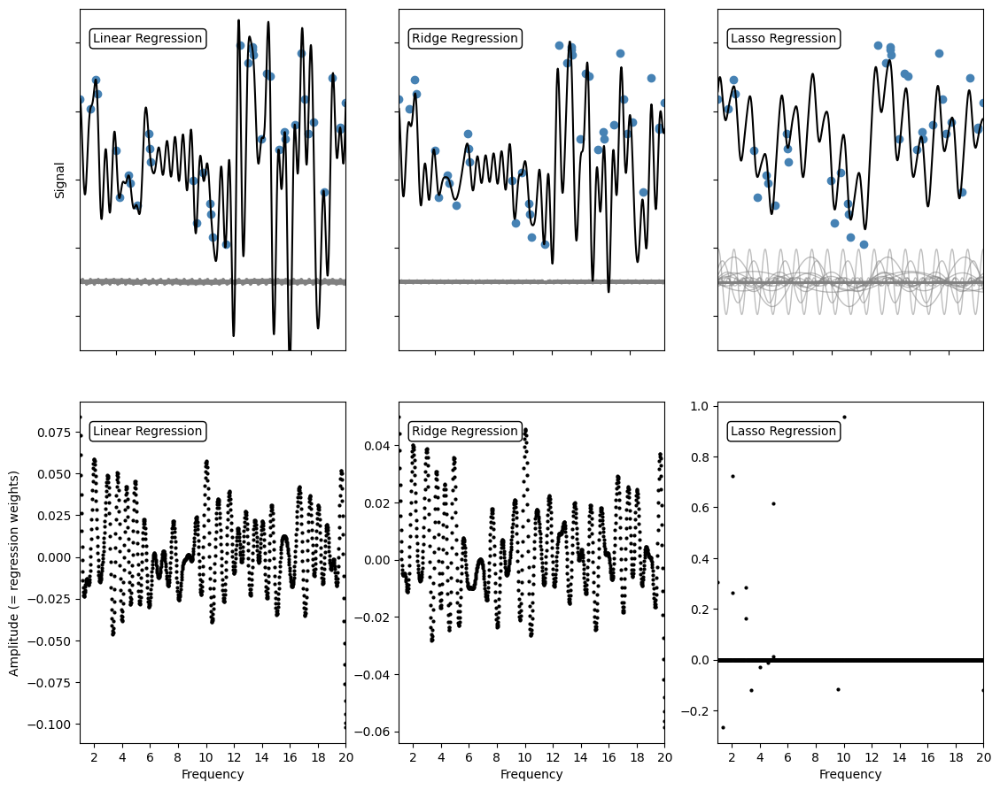

In [27]:
# https://www.astroml.org/book_figures/chapter8/fig_rbf_ridge_mu_z.html

# > Fit and display the model

#%pip install pymc3 
#%pip install astroml
from astroML.linear_model import LinearRegression

# Set up the figure to plot the results:
fig = plt.figure(figsize=(12, 10))
fig.subplots_adjust(left=0.1, right=0.95,
                    bottom=0.12, top=0.95,
                    hspace=0.15, wspace=0.2)

regularization = ['none', 'l2', 'l1']

'''
Plug in the alpha (regularization coefficient) that you want to attempt:
  - first entry:  Ridge Regression regularization
  - second entry: Lasso Regression regularization
e.g., kwargs = [dict(), dict(alpha=0.1), dict(alpha=0.1)]
'''
kwargs = [dict(), dict(alpha=100), dict(alpha=0.1)]
labels = ['Linear Regression', 'Ridge Regression', 'Lasso Regression']
fits = {
  'Linear Regression': [],
  'Ridge Regression': [],
  'Lasso Regression' : []
}


for i in range(3):

    print('Regularization:', regularization[i])
    clf = LinearRegression(regularization=regularization[i],
                           fit_intercept=True, kwds=kwargs[i])
    clf.fit(X, y)
    w = clf.coef_[1:] # ignoring bias

    # > Plotting
    xx = np.linspace(times[0], times[-1], 1000)
    # generating 1000 equally spaced points to display curves
    fit = clf.predict(sinusoidal_basis(xx[:, None], frequencies, amplitudes, theta))

    ax = fig.add_subplot(231 + i)
    ax.xaxis.set_major_formatter(plt.NullFormatter())

    # plot curves for regularized fits
    if i == 0:
        ax.set_ylabel('Signal')

    # Plotting components:
    ax.yaxis.set_major_formatter(plt.NullFormatter())
    vertical_offset = -3
    # just moving the sinusoids lower, to better visualize them

    curves = vertical_offset + w * sinusoidal_basis(xx[:, np.newaxis], frequencies, amplitudes, theta)
    #curves = curves[:, abs(w) > 0.01]
    # only displaying curves with significant weigjts

    ax.plot(xx, curves, c='gray', lw=1, alpha=0.5)

    # Plotting fit and data:
    ax.plot(xx, fit, c='black')
    ax.scatter(times, y, c='steelblue')

    fits[labels[i]] = [xx, fit]

    #ax.errorbar(times, y, dy, fmt='.k', ecolor='steelblue', lw=1, ms=4)
    ax.set_xlim(times[0], times[-1])
    ax.set_ylim(-5, 5)
    ax.text(0.05, 0.93, labels[i],
            ha='left', va='top',
            bbox=dict(boxstyle='round', ec='k', fc='w'),
            transform=ax.transAxes)

    # plot weights
    ax = plt.subplot(234 + i)
    ax.xaxis.set_major_locator(plt.MultipleLocator(0.5))
    ax.set_xlabel('Frequency')
    if i == 0:
        ax.set_ylabel(r'Amplitude (= regression weights)')
        #w *= 1E-12
        #ax.text(0, 1.01, r'$\rm \times 10^{12}$',
        #        transform=ax.transAxes)
    ax.scatter(frequencies, w, s=9, lw=0, c='k')

    ax.set_xlim(frequencies[0], frequencies[-1])
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    ax.text(0.05, 0.93, labels[i],
            ha='left', va='top',
            bbox=dict(boxstyle='round', ec='k', fc='w'),
            transform=ax.transAxes)
    
    if labels[i] == 'Lasso Regression':
        print('\tSignificant frequencies (amp > 0.1):\n\t%s' %\
              [round(frequency, 2) for frequency in frequencies[abs(w) > 0.1]])

plt.show()

In [28]:
# > Let's compare the original and the reconstructed signal

# Loading real signal:
df_sinewave = pd.read_csv('df_sinewave.csv')

time     = df_sinewave['times'].values
sinewave = df_sinewave['sinewave'].values


# Plotting:
fig = go.Figure(layout=dict(xaxis=dict(title='Time (sec)'),yaxis=dict(title='Amplitude')))
fig.add_scatter(x=time, y=sinewave, line=dict(width=5), name='Signal')
fig.add_scatter(x=fits['Linear Regression'][0], y=fits['Linear Regression'][1],
                line=dict(dash="dot", width=3, color='grey'), name='no regul.')
fig.add_scatter(x=fits['Lasso Regression'][0], y=fits['Lasso Regression'][1],
                line=dict(dash="dot", width=3, color='red'), name='Lasso')
fig.show()


<hr style='height:1px'>

**IMPORTANT**: Do NOT forget to write your group name in the cell below, and rename this file to \<group\>\_HW\<N\>\_2024.ipynb, where "\<group\>" is your group name and \<N\> is the Homework number.

_It's enough that 1 student of the group submits the solutions for the whole group._

You can leave the above code or $-$ _better!_ $-$ remove it.  But, in any case, <u>make sure</u> that the notebook gives the results you expected when it's run from top to bottom (you might have saved variables in blocks executed before and then deleted!).  We will not debug it for you!

**Group name**: _ _ _ _ _ _

<hr style='height:1px'>

# HomeWork06

<font size=1>
    Nikolaos Vasilas & Elias Kyritsis, 2024. All rights reserved.
</font>  

<div class="alert alert-block alert-warning" style="margin-top: 20px">
       
**Exercise 1: Regularization and Pipelines**
<br><br>

We will follow this week's lecture and try to better understand the Regularization algorithms and how to use pipelines to train and optimize models. 

This week, let us use the provided dataset as a black box (no physics, no biology, and no company data behind it). The file ```HW06_data.csv```, which is the dataset you will use, contains 20,000 samples and 13 features (including the target). 
Your goal is to find the best model that predicts the class of an instance most accurately. 
<br><br>

 **Tasks:**
 - **Ex. 1.1**:  Load the data from the file ```HW06_data.csv```.
    - Convert the values in the "target" feature to numerical values (integers) where you will replace 'class_1' $\rightarrow$ 0 and 'class_2' $\rightarrow$ 1.
    - Plot preliminary plots and print informative information about the dataset (you need to have 2 plots). 
    - Select all the available features and split the dataset into 70% for training and 30% for testing.
    - Go back to your notebook and remind yourself of the classifiers you already know. In a markdown cell, briefly write which one of them you expect to perform the best. 
<br><br>
    
- **Ex 1.2**: Build the following three models considering the same regularization strength `C` = 0.001 :

        a) A Logistic regression model with regularization "none"
        b) A Logistic regression model with regularization "l1"
        c) A Logistic regression model with regularization "l2"
    
    - Plot the coefficient values of the features as a function of the number of features for each regularization method. Plot all of them in one plot. **What do you notice about the absolute coefficient values for the different regularization methods?** Comment in one or two sentences.
<br>

- **Ex.1.3**: Go back to section "_Model selection, the right way_" and modify it to implement normalization in the model selection process.
    - Instead of `RandomizedSearchCV`, use `GridSearchCV`.
    - Set `n_jobs = -1` in `GridSearchCV`.

    The models and their hyperparameters to try are:
    
        a) **RandomForest**  
            - `n_estimators`
            - `max_depth`
            - `max_features`
            - `min_samples_split`
            - `min_samples_leaf`

        b) **SVM**  
            - `C`
            - `kernel`

        c) **LogisticRegression**  
            - `C`
            - `penalty`
            - `solver`

        d) **kNN**  
            - `n_neighbors`
            - `metric`
    
    Print the accuracy of the best model and plot its confusion matrix. 
 
**Hints:**
- _For Ex.1.2_ $-$ Explore the documentation of Logistic Regression to see which **solvers** can be implemented to account for the different types of **Regularization** (i.e., l1, l2, None). The documentation of ```LogisticRegression()``` is [here](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html). When you do that, iterate over the different regularizations and keep the coefficient values of each iteration in a list. Use this list to make the plot.<br><br>

- _For Ex.1.3_ $-$ You have to use the Pipeline method. 


- _For Ex.1.3_ $-$ Your parameter grid should be a list of dictionaries to account for the fact that different solvers work with different regularization methods. Otherwise, you will get an error.
    
    _Example:_
    
    
    ```python
        param_grid = {
            'RandomForest': {
                'classifier__n_estimators': [10, 50, 100, 200, 500],
                 '{... another, similar dictionary ...},
                 '{... another, similar dictionary ...},
            },
            
            'SVM': {
                'classifier__C': [0.01, 0.1, 1, 10, 100],
                '{... another, similar dictionary ...},
                '{... another, similar dictionary ...},
            },
            
            'LogisticRegression': {
                'classifier__C': [0.01, 0.1, 1, 10, 100],
                 '{... another, similar dictionary ...},
                 '{... another, similar dictionary ...},
            },
            
            'kNN': {
                'classifier__n_neighbors': list(range(1, 11)),
                 '{... another, similar dictionary ...},
                 '{... another, similar dictionary ...},
            }
        }
    ```

</div>

C:\Users\arisk\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


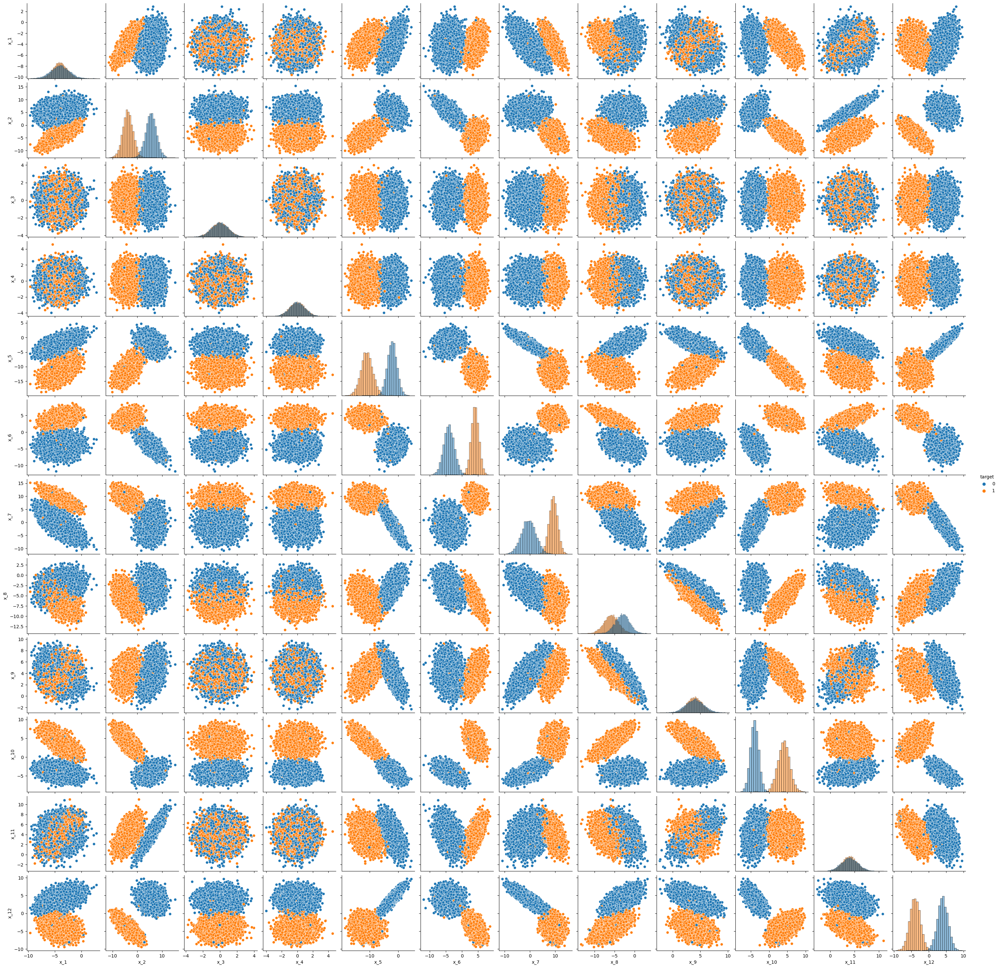

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,x_11,x_12,target
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,-4.005578,0.923115,0.000595,-0.000074,-6.598070,0.000016,4.290917,-4.375932,4.018789,-0.001445,4.020044,-0.009065,0.500900
std,1.524363,5.127431,0.997740,0.993766,4.856778,4.272501,5.431929,2.265014,1.494891,4.231212,1.647105,4.273403,0.500012
min,-9.632486,-11.443556,-3.794637,-3.999332,-18.737237,-11.811176,-10.885883,-13.342143,-2.309819,-8.350996,-2.632038,-9.454386,0.000000
25%,-5.016315,-3.770271,-0.678600,-0.673180,-11.088448,-4.030222,-0.579424,-5.959099,3.010028,-4.004081,2.919841,-4.011646,0.000000
50%,-4.004712,0.775278,-0.003864,-0.007193,-6.100295,0.819940,5.467440,-4.345806,4.024397,-0.637325,4.018689,-0.012635,1.000000
75%,-2.987695,5.593490,0.674003,0.674662,-2.122950,4.017525,9.190189,-2.734411,5.024792,4.011348,5.115297,3.977815,1.000000
max,2.857220,15.320295,3.976868,4.562115,4.706040,8.702470,15.359986,3.274270,9.687600,9.831385,10.988670,9.685194,1.000000


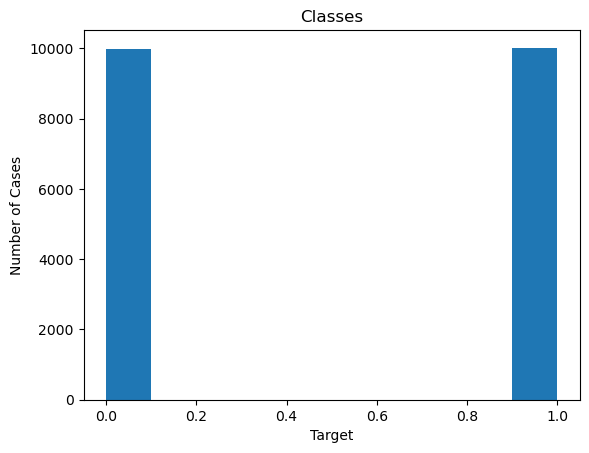

C:\Users\arisk\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1182: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
C:\Users\arisk\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1192: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


accuracy none :0.994
accuracy l1 :0.994
accuracy l2 :0.994


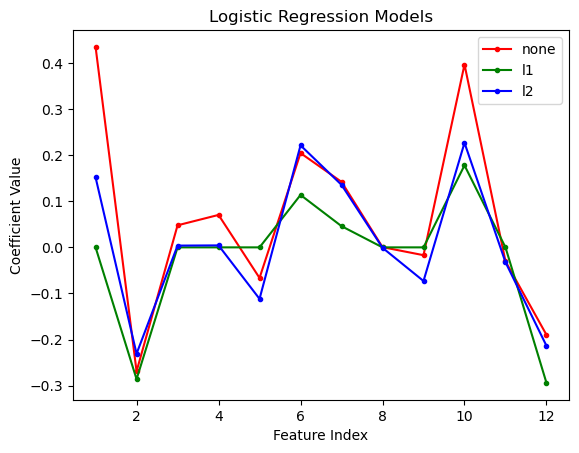



Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best Parameters: {'classifier': RandomForestClassifier(max_depth=2, n_estimators=50), 'classifier__max_depth': 2, 'classifier__n_estimators': 50}
Best Model Accuracy: 0.9941428571428572


[[2956   14]
 [  22 3008]]


In [21]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline


df=pd.read_csv('C:/Users/arisk/Desktop/Machine Learning/6/HW06_data.csv')
df['target']=df['target'].replace({'class_2':1,'class_1':0})
sns.pairplot(df,hue="target",diag_kind='hist')
plt.show()
X=df[['x_1','x_2','x_3','x_4','x_5','x_6','x_7','x_8','x_9','x_10','x_11','x_12']]
y=df['target']
xtrain,xtest,ytrain,ytest=train_test_split(
    X, y, test_size=0.3, random_state=42)
info=df.describe()
display(info)

plt.hist(df['target'])
plt.xlabel('Target')
plt.ylabel('Number of Cases')
plt.title('Classes')
plt.show()
#imma use logistic regresion h  svm  giati ta data  mu fenode kala seperated 
# dedra oxi giati den moiazun toso berdemena

r=['none','l1','l2']
colors=['red','green','blue']

for i,k in zip(r,colors):
    if i=='none':
        model=LogisticRegression(penalty=i,solver='lbfgs',C=0.001)
    else :
        model=LogisticRegression(penalty=i,C=0.001,solver='liblinear')
    model.fit(xtrain,ytrain)
    coe = model.coef_[0]   
    y_pred=model.predict(xtest)
    
    plt.plot(range(1,13),coe,'.-',color=k,label=i)    
    plt.legend() 
    plt.xlabel('Feature Index')
    plt.ylabel('Coefficient Value')
    plt.title('Logistic Regression Models')
    acc=accuracy_score(ytest, y_pred)
    print(f'accuracy {i} :{acc}')
    
plt.show()    
param_grid = [
    
    {   'classifier':[RandomForestClassifier()],
        'classifier__n_estimators': [10, 50, 100, 200, 500],
        'classifier__max_depth': [2, 3, 4, 5, 6]},
    
    {   'classifier': [SVC()],
        'classifier__C': [0.01, 0.1, 1, 10, 100],
        'classifier__kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
    
    {   'classifier': [LogisticRegression()],
        'classifier__C': [0.01, 0.1, 1, 10, 100],
        'classifier__penalty': ['none', 'l1', 'l2'],
        'classifier__solver': ['saga']},
    
    {   'classifier': [KNeighborsClassifier()],
        'classifier__n_neighbors': list(range(1, 11)),
        'classifier__weights': ['uniform', 'distance'],
        'classifier__p': [1, 2]}
]
print('\n')

pipeline = Pipeline([
    ('scaler', StandardScaler()),  
    ('classifier', RandomForestClassifier())  ])
    
grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1 ,scoring='accuracy', verbose=4)

grid_search.fit(xtrain,ytrain)
print("Best Parameters:", grid_search.best_params_)
print("Best Model Accuracy:", grid_search.best_score_)
best_model = grid_search.best_estimator_
print('\n')

y1=best_model.predict(xtest)
cm = confusion_matrix(ytest, y1)
print(cm)

In [18]:
#EOF